### 1. Import libraries and dataset

In [316]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.linear_model  import LogisticRegression
from sklearn.naive_bayes import MultinomialNB,GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC,LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,BaggingClassifier
from sklearn.metrics import f1_score, classification_report, confusion_matrix,accuracy_score,log_loss,roc_auc_score,precision_score,recall_score
from sklearn.model_selection import KFold, cross_val_score

### Data exploration

In [317]:
signal_df = pd.read_csv('signal-data.csv')

In [318]:
#Size of the dataset : 1567 rows and 592 columns
signal_df.shape

(1567, 592)

In [319]:
#Datatypes of the columns in dataset
signal_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB


In [320]:
#5 point summary 
signal_df.describe()


,0,1,2,3,4,5,6,7,8,9,...,581,582,583,584,585,586,587,588,589,Pass/Fail
count,1561.000000,1560.000000,1553.000000,1553.000000,1553.000000,1553.0,1553.000000,1558.000000,1565.000000,1565.000000,...,618.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1566.000000,1567.000000
mean,3014.452896,2495.850231,2200.547318,1396.376627,4.197013,100.0,101.112908,0.121822,1.462862,-0.000841,...,97.934373,0.500096,0.015318,0.003847,3.067826,0.021458,0.016475,0.005283,99.670066,-0.867262
std,73.621787,80.407705,29.513152,441.691640,56.355540,0.0,6.237214,0.008961,0.073897,0.015116,...,87.520966,0.003404,0.017180,0.003720,3.578033,0.012358,0.008808,0.002867,93.891919,0.498010
min,2743.240000,2158.750000,2060.660000,0.000000,0.681500,100.0,82.131100,0.000000,1.191000,-0.053400,...,0.000000,0.477800,0.006000,0.001700,1.197500,-0.016900,0.003200,0.001000,0.000000,-1.000000
25%,2966.260000,2452.247500,2181.044400,1081.875800,1.017700,100.0,97.920000,0.121100,1.411200,-0.010800,...,46.184900,0.497900,0.011600,0.003100,2.306500,0.013425,0.010600,0.003300,44.368600,-1.000000
50%,3011.490000,2499.405000,2201.066700,1285.214400,1.316800,100.0,101.512200,0.122400,1.461600,-0.001300,...,72.288900,0.500200,0.013800,0.003600,2.757650,0.020500,0.014800,0.004600,71.900500,-1.000000
75%,3056.650000,2538.822500,2218.055500,1591.223500,1.525700,100.0,104.586700,0.123800,1.516900,0.008400,...,116.539150,0.502375,0.016500,0.004100,3.295175,0.027600,0.020300,0.006400,114.749700,-1.000000
max,3356.350000,2846.440000,2315.266700,3715.041700,1114.536600,100.0,129.252200,0.128600,1.656400,0.074900,...,737.304800,0.509800,0.476600,0.104500,99.303200,0.102800,0.079900,0.028600,737.304800,1.000000


#### From the summary above, we can say that most of the columns have high standard deviation from the mean. Also from the count of columns, we have missing values in some of the columns.

In [321]:
signal_df.head(5)

,Time,0,1,2,3,4,5,6,7,8,...,581,582,583,584,585,586,587,588,589,Pass/Fail
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100.0,97.6133,0.1242,1.5005,...,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN,-1
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100.0,102.3433,0.1247,1.4966,...,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045,-1
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100.0,95.4878,0.1241,1.4436,...,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602,1
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100.0,104.2367,0.1217,1.4882,...,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432,-1
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100.0,100.3967,0.1235,1.5031,...,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432,-1


### 2. Data cleansing

In [322]:
#Check for null values
signal_df.isnull().sum()

Time          0
0             6
1             7
2            14
3            14
             ..
586           1
587           1
588           1
589           1
Pass/Fail     0
Length: 592, dtype: int64

In [323]:
#Dropping null values.
signal_processed_df=signal_df.dropna(axis='columns')

In [324]:
signal_processed_df.dropna()

,Time,20,86,87,88,113,114,115,116,117,...,527,570,571,572,573,574,575,576,577,Pass/Fail
0,2008-07-19 11:55:00,1.4026,2.3895,0.9690,1747.6049,0.9460,0.0,748.6115,0.9908,58.4306,...,6.6926,533.8500,2.1113,8.95,0.3157,3.0624,0.1026,1.6765,14.9509,-1
1,2008-07-19 12:32:00,1.3825,2.3754,0.9894,1931.6464,0.9425,0.0,731.2517,0.9902,58.6680,...,8.8370,535.0164,2.4335,5.92,0.2653,2.0111,0.0772,1.1065,10.9003,-1
2,2008-07-19 13:17:00,1.4123,2.4532,0.9880,1685.8514,0.9231,0.0,718.5777,0.9899,58.4808,...,6.4568,535.0245,2.0293,11.21,0.1882,4.0923,0.0640,2.0952,9.2721,1
3,2008-07-19 14:43:00,1.4011,2.4004,0.9904,1752.0968,0.9564,0.0,709.0867,0.9906,58.6635,...,6.4865,530.5682,2.0253,9.33,0.1738,2.8971,0.0525,1.7585,8.5831,-1
4,2008-07-19 15:22:00,1.3888,2.4530,0.9902,1828.3846,0.9424,0.0,796.5950,0.9908,58.3858,...,6.3745,532.0155,2.0275,8.83,0.2224,3.1776,0.0706,1.6597,10.9698,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,1.4072,2.3762,0.9861,1869.4215,0.9520,0.0,727.6761,0.9894,58.3514,...,2.6649,536.3418,2.0153,7.98,0.2363,2.6401,0.0785,1.4879,11.7256,-1
1563,2008-10-16 20:49:00,1.3949,2.4880,0.9911,1872.5133,0.9561,0.0,755.7527,0.9899,57.1020,...,6.0192,537.9264,2.1814,5.48,0.3891,1.9077,0.1213,1.0187,17.8379,-1
1564,2008-10-17 05:26:00,1.4256,2.4590,0.9869,1820.3629,0.9488,0.0,704.2686,0.9891,59.2046,...,5.4641,530.3709,2.3435,6.49,0.4154,2.1760,0.1352,1.2237,17.7267,-1
1565,2008-10-17 06:01:00,1.3868,2.3600,0.9796,1627.4714,0.9485,0.0,605.6190,0.9896,58.2686,...,6.5512,534.3936,1.9098,9.13,0.3669,3.2524,0.1040,1.7085,19.2104,-1


In [325]:
#Check for null values after dropping null values
signal_processed_df.isnull().sum()


Time         0
20           0
86           0
87           0
88           0
113          0
114          0
115          0
116          0
117          0
119          0
120          0
156          0
221          0
222          0
223          0
248          0
249          0
250          0
251          0
252          0
254          0
255          0
291          0
359          0
360          0
361          0
386          0
387          0
388          0
389          0
390          0
392          0
393          0
429          0
493          0
494          0
495          0
520          0
521          0
522          0
523          0
524          0
526          0
527          0
570          0
571          0
572          0
573          0
574          0
575          0
576          0
577          0
Pass/Fail    0
dtype: int64

In [326]:
signal_processed_df.isnull().values.any()

False

#### Since there are no more null values, we can proceed further.

In [327]:
#Check for columns that have few values 
unique_count=signal_processed_df.nunique()
unique_count

Time         1534
20            552
86            472
87            249
88            973
113           468
114            20
115          1567
116           136
117          1527
119           249
120          1269
156           722
221           408
222           178
223           973
248           426
249            23
250          1566
251           143
252          1533
254           291
255          1317
291           354
359           215
360            97
361           972
386           191
387            22
388          1564
389            92
390          1458
392           109
393           953
429          1542
493           572
494           894
495           964
520          1536
521             9
522          1562
523          1040
524          1543
526          1514
527          1549
570           814
571           811
572           518
573           754
574           830
575           599
576           820
577           851
Pass/Fail       2
dtype: int64

In [328]:
#Drop the columns that have single values
to_del = [i for i,v in enumerate(unique_count) if v == 1]
to_del

[]

In [329]:
signal_processed_df.drop(columns=to_del,axis=1)

,Time,20,86,87,88,113,114,115,116,117,...,527,570,571,572,573,574,575,576,577,Pass/Fail
0,2008-07-19 11:55:00,1.4026,2.3895,0.9690,1747.6049,0.9460,0.0,748.6115,0.9908,58.4306,...,6.6926,533.8500,2.1113,8.95,0.3157,3.0624,0.1026,1.6765,14.9509,-1
1,2008-07-19 12:32:00,1.3825,2.3754,0.9894,1931.6464,0.9425,0.0,731.2517,0.9902,58.6680,...,8.8370,535.0164,2.4335,5.92,0.2653,2.0111,0.0772,1.1065,10.9003,-1
2,2008-07-19 13:17:00,1.4123,2.4532,0.9880,1685.8514,0.9231,0.0,718.5777,0.9899,58.4808,...,6.4568,535.0245,2.0293,11.21,0.1882,4.0923,0.0640,2.0952,9.2721,1
3,2008-07-19 14:43:00,1.4011,2.4004,0.9904,1752.0968,0.9564,0.0,709.0867,0.9906,58.6635,...,6.4865,530.5682,2.0253,9.33,0.1738,2.8971,0.0525,1.7585,8.5831,-1
4,2008-07-19 15:22:00,1.3888,2.4530,0.9902,1828.3846,0.9424,0.0,796.5950,0.9908,58.3858,...,6.3745,532.0155,2.0275,8.83,0.2224,3.1776,0.0706,1.6597,10.9698,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,2008-10-16 15:13:00,1.4072,2.3762,0.9861,1869.4215,0.9520,0.0,727.6761,0.9894,58.3514,...,2.6649,536.3418,2.0153,7.98,0.2363,2.6401,0.0785,1.4879,11.7256,-1
1563,2008-10-16 20:49:00,1.3949,2.4880,0.9911,1872.5133,0.9561,0.0,755.7527,0.9899,57.1020,...,6.0192,537.9264,2.1814,5.48,0.3891,1.9077,0.1213,1.0187,17.8379,-1
1564,2008-10-17 05:26:00,1.4256,2.4590,0.9869,1820.3629,0.9488,0.0,704.2686,0.9891,59.2046,...,5.4641,530.3709,2.3435,6.49,0.4154,2.1760,0.1352,1.2237,17.7267,-1
1565,2008-10-17 06:01:00,1.3868,2.3600,0.9796,1627.4714,0.9485,0.0,605.6190,0.9896,58.2686,...,6.5512,534.3936,1.9098,9.13,0.3669,3.2524,0.1040,1.7085,19.2104,-1


In [330]:
signal_processed_df.drop(to_del, axis=1)
print(signal_processed_df.shape)

(1567, 54)


In [331]:
signal_processed_df.drop('Time',axis=1,inplace=True)

C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


### 3. Data analysis & visualisation:

In [332]:
#Correlation between variables
signal_corr = signal_processed_df.corr()

In [333]:
signal_corr

,20,86,87,88,113,114,115,116,117,119,...,527,570,571,572,573,574,575,576,577,Pass/Fail
20,1.000000,0.050032,0.055319,-0.065107,0.024664,-0.031431,0.025619,0.046091,0.019993,-0.001825,...,-0.046716,-0.000205,-0.021436,-0.025429,-0.020366,-0.022118,-0.025880,-0.024596,-0.026571,0.023253
86,0.050032,1.000000,0.031000,-0.003571,0.014488,-0.024863,-0.014257,0.028356,0.014794,-0.001545,...,-0.043544,-0.006474,-0.012701,0.033938,0.052387,0.029529,0.056517,0.032696,0.053237,0.024974
87,0.055319,0.031000,1.000000,-0.061580,0.106847,-0.042029,-0.052125,-0.003568,-0.033015,-0.005589,...,-0.026713,0.025988,-0.031415,0.012448,0.028469,0.007819,0.027971,0.009253,0.035851,-0.030422
88,-0.065107,-0.003571,-0.061580,1.000000,0.100660,0.009750,0.116503,0.003269,0.010875,0.026516,...,-0.003777,-0.022459,0.020736,-0.026952,-0.017848,-0.026170,-0.016366,-0.024665,-0.021203,0.026865
113,0.024664,0.014488,0.106847,0.100660,1.000000,-0.285839,-0.041832,0.056295,0.019973,0.025750,...,-0.047714,0.068486,-0.135673,0.000455,-0.019055,-0.006844,-0.033629,-0.005915,0.010921,0.001328
114,-0.031431,-0.024863,-0.042029,0.009750,-0.285839,1.000000,-0.005372,-0.046802,-0.007135,-0.034011,...,0.005271,0.009354,0.048395,-0.013727,-0.006772,-0.013679,0.003335,-0.013976,-0.013607,0.068655
115,0.025619,-0.014257,-0.052125,0.116503,-0.041832,-0.005372,1.000000,0.000273,-0.005960,0.042306,...,0.001207,-0.019066,-0.024488,0.030013,0.036066,0.027323,0.040390,0.030523,0.041202,-0.043654
116,0.046091,0.028356,-0.003568,0.003269,0.056295,-0.046802,0.000273,1.000000,-0.070123,-0.010319,...,0.058791,0.006897,-0.096214,0.024899,-0.016263,0.024734,-0.010626,0.023093,0.005018,-0.012912
117,0.019993,0.014794,-0.033015,0.010875,0.019973,-0.007135,-0.005960,-0.070123,1.000000,-0.012869,...,-0.033664,-0.003324,-0.017164,-0.002197,-0.009813,-0.002848,-0.009048,-0.002175,-0.006304,-0.016720
119,-0.001825,-0.001545,-0.005589,0.026516,0.025750,-0.034011,0.042306,-0.010319,-0.012869,1.000000,...,0.073035,-0.004159,-0.031574,-0.013043,-0.016697,-0.014020,-0.012939,-0.013427,-0.009130,0.005612


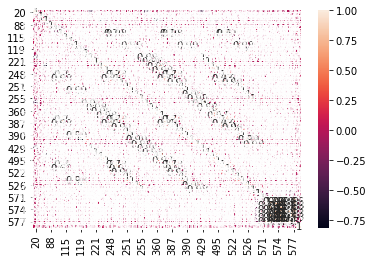

In [937]:
#heatmap
sns.heatmap(signal_corr,annot=True)

#### From the correlation matrix above, we can say that majority of the variables are independent of each other. Variables 572 to 575 have high correlation with variable 575,574,576,572.

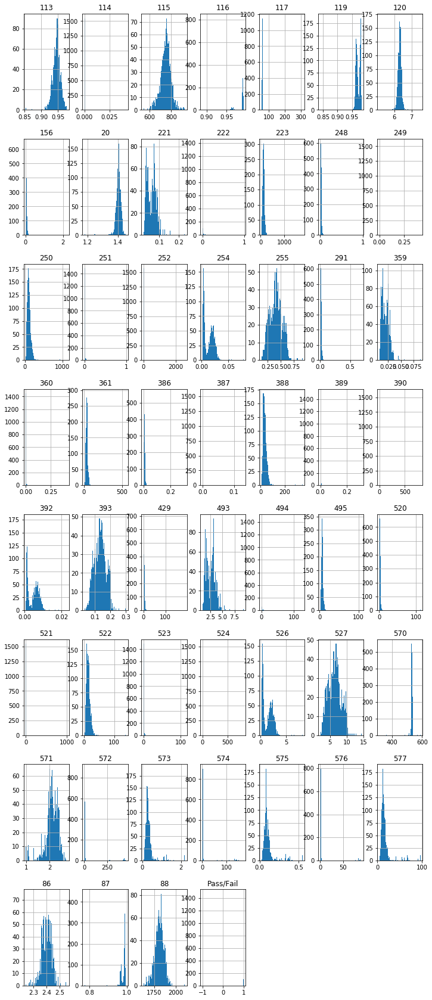

In [334]:
#Distribution of variables
signal_processed_df.hist(stacked=False, bins=100, figsize=(12,30)); 

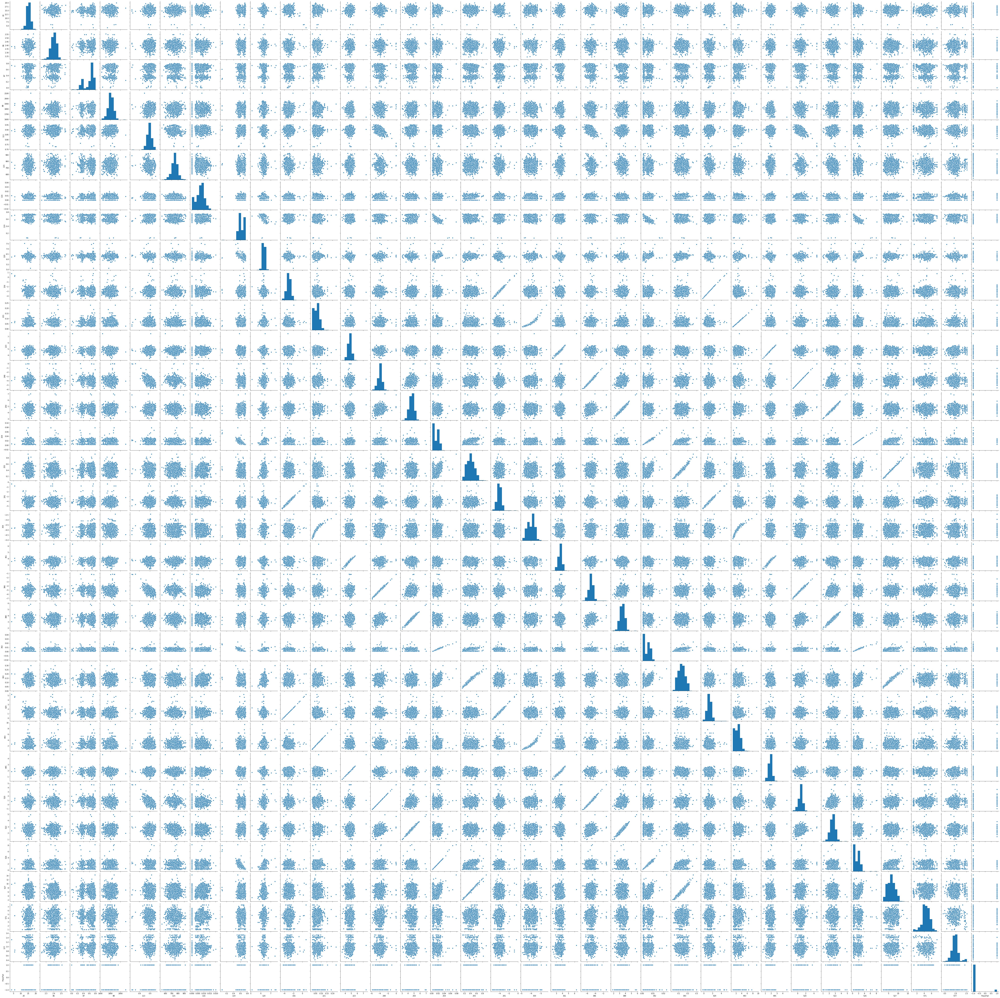

In [938]:
#Pairplot
sns.pairplot(signal_processed_df)

#### From the pairplot above , we can see scattered plot with less or no correlation for most of the variables. Whereas for some , we can see positive correlation.

#### From the distribution represented in histogram above, some variables are negatively skewed and some are positively skewed. We will handle negatively skewed data by performing squared function. For positively skewed data, we will perform logarithmic function

In [376]:
#retrieving negatively skewed variable indices and performing squared function
skew_ind=signal_processed_df.iloc[:,:-1]

to_skew_neg = skew_ind.skew().index[(skew_ind.skew() < -1)]

signal_processed_df.loc[:,to_skew_neg]=(signal_processed_df[to_skew_neg])**2
to_skew_neg

Index([], dtype='object')

In [375]:
signal_processed_df.iloc[:,:-1].skew()

C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\pandas\core\nanops.py:960: RuntimeWarning: overflow encountered in multiply
  adjusted3 = adjusted2 * adjusted
C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\pandas\core\nanops.py:972: RuntimeWarning: overflow encountered in power
  result = (count * (count - 1) ** 0.5 / (count - 2)) * (m3 / m2 ** 1.5)


20     -0.825134
86     -0.334554
87     -0.975940
88     -0.272824
113    -0.905260
114          NaN
115    -0.271651
116    -0.316694
117          NaN
119    -0.614053
120     0.351876
156     0.872707
221     0.759585
222          NaN
223     0.093581
248     0.576730
249          NaN
250    -0.040442
251          NaN
252    27.053379
254     0.585253
255     0.210229
291     0.800852
359    -0.082667
360          NaN
361    -0.223230
386     0.487965
387          NaN
388    -0.015867
389          NaN
390     4.665972
392     0.414009
393     0.102889
429     0.945522
493     0.724469
494    -0.614544
495     0.184196
520     0.617518
521          NaN
522    -0.085700
523     6.924957
524     3.635378
526     0.716253
527     0.181975
570          NaN
571    -0.562176
572     3.981499
573    -0.093918
574    -0.959446
575          NaN
576    -0.802692
577     0.772584
dtype: float64

In [380]:
#retrieving positively skewed variable indices and performing logarithmic function
to_skew_pos = signal_processed_df.iloc[:,:-1].skew().index[signal_processed_df.iloc[:,:-1].skew() > 1]
signal_processed_df.loc[:,to_skew_pos]=np.log(signal_processed_df[to_skew_pos])
to_skew_pos

Index([], dtype='object')

In [388]:
signal_processed_df.iloc[:,:-1].skew()

20    -0.825134
86    -0.334554
87    -0.975940
88    -0.272824
113   -0.905260
115   -0.271651
116   -0.316694
119   -0.614053
120    0.351876
156    0.872707
221    0.759585
223    0.093581
248    0.576730
250   -0.040442
254    0.585253
255    0.210229
291    0.800852
359   -0.082667
361   -0.223230
386    0.487965
388   -0.015867
392    0.414009
393    0.102889
429    0.945522
493    0.724469
495    0.184196
520    0.617518
522   -0.085700
526    0.716253
527    0.181975
571   -0.562176
577    0.772584
dtype: float64

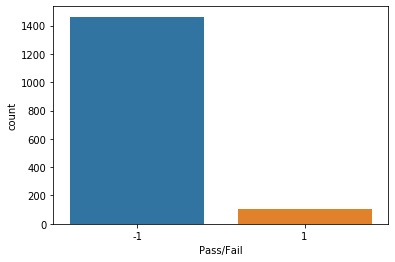

In [385]:
#Distribution of target class in original dataset
sns.countplot(signal_processed_df['Pass/Fail'])

#### The Pass - Fail ratio is highly imbalanced

In [386]:
signal_processed_df.astype(np.float)

,20,86,87,88,113,114,115,116,117,119,...,522,526,527,571,573,574,575,576,577,Pass/Fail
0,14.978581,2.3895,0.365057,1747.6049,0.894916,-inf,748.6115,0.008807,NaN,0.728539,...,3.380328,0.5064,6.6926,4.457588,NaN,-2.183797,NaN,-0.660277,0.995017,-1.0
1,13.345078,2.3754,0.711051,1931.6464,0.888306,-inf,731.2517,0.006459,NaN,0.646427,...,3.273250,0.8832,8.8370,5.921922,NaN,NaN,NaN,-2.290638,0.870787,-1.0
2,15.827622,2.4532,0.679551,1685.8514,0.852114,-inf,718.5777,0.005530,NaN,0.691409,...,2.676167,0.6451,6.4568,4.118058,NaN,-1.070152,NaN,-0.301580,0.800660,1.0
3,14.850910,2.4004,0.734413,1752.0968,0.914701,-inf,709.0867,0.007942,NaN,0.679061,...,2.585498,0.7404,6.4865,4.101840,NaN,-2.784450,NaN,-0.571884,0.765373,-1.0
4,13.839413,2.4530,0.729682,1828.3846,0.888118,-inf,796.5950,0.008807,NaN,0.545227,...,2.930228,2.2181,6.3745,4.110756,NaN,-1.930505,NaN,-0.679961,0.873444,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1562,15.376115,2.3762,0.638956,1869.4215,0.906304,-inf,727.6761,0.004270,NaN,0.552521,...,2.016888,1.2587,2.6649,4.061434,NaN,NaN,NaN,-0.922898,0.900882,-1.0
1563,14.333247,2.4880,0.751206,1872.5133,0.914127,-inf,755.7527,0.005530,NaN,0.730921,...,1.846737,0.4512,6.0192,4.758506,NaN,NaN,NaN,-3.988510,1.058250,-1.0
1564,17.060097,2.4590,0.655754,1820.3629,0.900221,-inf,704.2686,0.003656,NaN,0.685771,...,2.813059,0.4867,5.4641,5.491992,NaN,NaN,NaN,-1.600086,1.056078,-1.0
1565,13.680774,2.3600,0.517084,1627.4714,0.899652,-inf,605.6190,0.004735,NaN,0.729729,...,2.798372,0.3866,6.5512,3.647336,NaN,-1.801809,NaN,-0.624338,1.083652,-1.0


#### Post handling skewness, we will see if we have infinity or null values

In [387]:
signal_processed_df.replace([np.inf,-np.inf], np.NaN,inplace=True)
signal_processed_df.dropna(axis='columns',inplace=True)

C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\pandas\core\frame.py:4172: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [389]:
signal_processed_df.shape

(1567, 33)

In [142]:
#sns.pairplot(signal_processed_df)

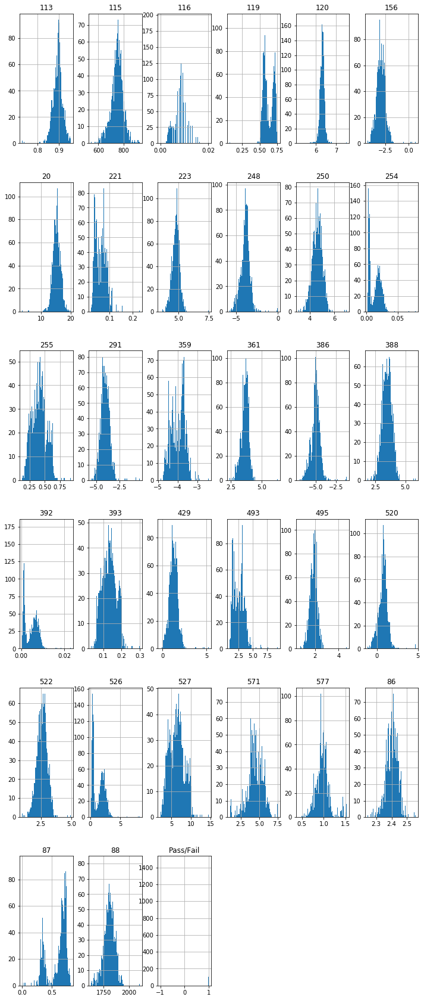

In [390]:
#Distribution of variables post cleaning
signal_processed_df.hist(stacked=False, bins=100, figsize=(12,30)); 

### 4. Data Pre-processing

In [391]:

#predictors and target variables

X_signal_processed=signal_processed_df.iloc[:,:-1]
Y_signal = signal_processed_df['Pass/Fail']
X_signal_processed.head(5)

,20,86,87,88,113,115,116,119,120,156,...,393,429,493,495,520,522,526,527,571,577
0,14.978581,2.3895,0.365057,1747.6049,0.894916,748.6115,0.008807,0.728539,6.3788,-2.983804,...,0.1437,1.283264,2.9570,2.305192,0.686324,3.380328,0.5064,6.6926,4.457588,0.995017
1,13.345078,2.3754,0.711051,1931.6464,0.888306,731.2517,0.006459,0.646427,6.5061,-3.130407,...,0.1921,1.150414,3.2029,1.894421,0.488089,3.273250,0.8832,8.8370,5.921922,0.870787
2,15.827622,2.4532,0.679551,1685.8514,0.852114,718.5777,0.005530,0.691409,6.4527,-3.001750,...,0.1375,1.259029,3.9238,2.381868,1.086067,2.676167,0.6451,6.4568,4.118058,0.800660
3,14.850910,2.4004,0.734413,1752.0968,0.914701,709.0867,0.007942,0.679061,6.4935,-2.660690,...,0.1348,1.607396,3.1817,2.161068,0.892654,2.585498,0.7404,6.4865,4.101840,0.765373
4,13.839413,2.4530,0.729682,1828.3846,0.888118,796.5950,0.008807,0.545227,6.3551,-2.922482,...,0.1356,1.354649,3.2712,1.330279,0.936564,2.930228,2.2181,6.3745,4.110756,0.873444


In [392]:
signal_processed_df['Pass/Fail'].value_counts()

-1    1463
 1     104
Name: Pass/Fail, dtype: int64

In [146]:
#scale data
#scale=StandardScaler()
#std_columns=X_signal_processed.columns
#scale.fit(X_signal_processed)

#X_signal_processed=scale.transform(X_signal_processed)
#X_signal_processed_df=pd.DataFrame(X_signal_processed,columns=std_columns)

In [393]:
#Since the target class is imbalanced, we will perform oversampling using randomOverSampler.
from imblearn.under_sampling import TomekLinks,ClusterCentroids,RandomUnderSampler
from imblearn.over_sampling import SMOTE,RandomOverSampler
#tomekLink= TomekLinks()
#undersampling training set
#cc=ClusterCentroids()
#rus=RandomUnderSampler(sampling_strategy='auto')
#from imblearn.combine import SMOTETomek
#smt = SMOTETomek(sampling_strategy=0.1)
ros =RandomOverSampler(sampling_strategy='auto')
X_smt, y_smt = ros.fit_sample(X_signal_processed, Y_signal)

#X_ros,y_ros =ros.fit_sample(X_test,y_test)


In [394]:
X_smt.shape

(2926, 32)

In [395]:
#Split the data into train-test sets in 70:30 ratio
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test= train_test_split(X_smt,y_smt,random_state=30,test_size=0.30)

In [396]:
#Analysing the distribution of rows in train and test sets
print("no of rows in training set :",X_train.shape[0])
print("no of rows in testing set :",X_test.shape[0])

no of rows in training set : 2048
no of rows in testing set : 878


In [397]:
print("distribution of target class in training set :\n", y_train.value_counts())
print("distribution of target class in testing set :\n", y_test.value_counts())

distribution of target class in training set :
 -1    1027
 1    1021
Name: Pass/Fail, dtype: int64
distribution of target class in testing set :
  1    442
-1    436
Name: Pass/Fail, dtype: int64


#### From the count above for target class, we can say that it is fairly balanced after applying RandomOverSampler of oversampling

In [398]:
#statistical character post processing
signal_processed_df.describe()

,20,86,87,88,113,115,116,119,120,156,...,429,493,495,520,522,526,527,571,577,Pass/Fail
count,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1.567000e+03,1567.000000,1567.000000,1567.000000,...,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000,1567.000000
mean,15.246473,2.401872,0.598535,1807.815021,0.893974,747.383792,6.957752e-03,0.627525,6.310863,-3.008415,...,1.256743,2.530046,1.864962,0.747532,2.600744,1.443457,6.395717,4.493354,0.973475,-0.867262
std,1.339493,0.037332,0.161268,53.537262,0.022792,48.949250,3.664514e-03,0.076674,0.124304,0.488662,...,0.491890,0.973948,0.313515,0.575051,0.420755,0.958428,1.888698,1.069621,0.153748,0.498010
min,3.751221,2.242500,0.000286,1627.471400,0.728292,544.025400,1.223724e-26,0.062743,5.125900,-4.500810,...,-0.243729,0.833000,0.572109,-1.164432,0.986227,0.170500,2.170000,0.960792,0.420114,-1.000000
25%,14.465303,2.376850,0.456611,1777.470300,0.880970,721.023000,4.496648e-03,0.563633,6.246400,-3.317317,...,0.944450,1.663750,1.662903,0.439641,2.320700,0.484200,4.895450,3.931892,0.893015,-1.000000
50%,15.271531,2.403900,0.666469,1809.249200,0.895673,750.861400,7.542124e-03,0.608203,6.313600,-3.022076,...,1.239475,2.529100,1.888266,0.797958,2.620500,1.550100,6.410800,4.488466,0.965448,-1.000000
75%,16.071319,2.428600,0.717983,1841.873000,0.906875,776.781850,9.274108e-03,0.703968,6.375850,-2.707550,...,1.559365,3.199100,2.066508,1.065986,2.879701,2.211650,7.594250,5.247077,1.043086,-1.000000
max,19.910458,2.555500,0.811656,2105.182300,0.953162,924.531800,2.011958e-02,0.756372,7.522000,0.789184,...,5.229055,9.402400,4.679281,4.716143,4.927136,8.203700,14.447900,7.504860,1.520454,1.000000


In [399]:
#training data summary
X_train.describe()

,20,86,87,88,113,115,116,119,120,156,...,393,429,493,495,520,522,526,527,571,577
count,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2.048000e+03,2048.000000,2048.000000,2048.000000,...,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000,2048.000000
mean,15.282506,2.404071,0.600454,1809.236452,0.894151,743.502929,6.709960e-03,0.628252,6.308254,-2.992665,...,0.133788,1.272144,2.588938,1.865730,0.746094,2.609278,1.403332,6.368471,4.480653,0.958703
std,1.309072,0.035616,0.158249,53.980465,0.021621,48.136530,3.688959e-03,0.074120,0.122740,0.508752,...,0.036658,0.511466,1.096342,0.301084,0.589476,0.399241,0.908839,1.822974,1.194005,0.146680
min,3.751221,2.242500,0.000286,1627.471400,0.728292,544.025400,1.223724e-26,0.062743,5.720700,-4.500810,...,0.034200,-0.243729,0.833000,0.572109,-1.164432,1.024607,0.171600,2.170000,0.969634,0.420114
25%,14.498482,2.378300,0.435749,1777.200500,0.881345,720.965750,4.269882e-03,0.564569,6.234600,-3.286085,...,0.107100,0.974484,1.686900,1.672168,0.404815,2.351337,0.477100,4.956600,3.925153,0.880803
50%,15.315031,2.406800,0.666469,1809.012900,0.896809,748.960900,7.542124e-03,0.613241,6.312100,-3.022076,...,0.133500,1.247578,2.574000,1.893646,0.800184,2.640378,1.498800,6.328500,4.649414,0.958876
75%,16.144153,2.429200,0.717983,1843.723700,0.906494,773.218100,9.274108e-03,0.701669,6.377100,-2.689719,...,0.158575,1.574122,3.216600,2.066508,1.093935,2.871795,2.138400,7.474400,5.306919,1.029829
max,19.910458,2.555500,0.811656,2105.182300,0.953162,924.531800,2.011958e-02,0.749016,7.522000,0.789184,...,0.299400,5.229055,9.402400,2.774162,4.713797,4.927136,8.203700,14.447900,7.504860,1.520454


In [400]:
X_test.describe()

,20,86,87,88,113,115,116,119,120,156,...,393,429,493,495,520,522,526,527,571,577
count,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,8.780000e+02,878.000000,878.000000,878.000000,...,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000,878.000000
mean,15.279469,2.401426,0.592960,1811.532403,0.894086,743.216696,6.615665e-03,0.626634,6.302492,-2.975800,...,0.131964,1.288951,2.541713,1.862517,0.741810,2.617671,1.414249,6.248789,4.435929,0.960850
std,1.265690,0.034806,0.168253,53.613223,0.022501,46.467299,3.692529e-03,0.075956,0.127756,0.494325,...,0.035347,0.495585,1.100866,0.318402,0.618776,0.425294,0.917808,1.747856,1.213062,0.145620
min,10.735231,2.248100,0.000286,1627.471400,0.728804,595.796000,2.927357e-22,0.065049,5.125900,-4.305066,...,0.048800,-0.034488,0.861400,0.775234,-0.963644,0.986227,0.170500,2.274700,0.960792,0.497598
25%,14.434257,2.376375,0.415128,1781.323300,0.882144,722.298825,4.054531e-03,0.562699,6.233775,-3.270169,...,0.106700,0.992622,1.636000,1.674748,0.417805,2.326009,0.452500,4.917600,3.896676,0.892172
50%,15.288918,2.405900,0.662163,1809.539650,0.896052,748.055600,7.162150e-03,0.613241,6.304950,-3.024132,...,0.131400,1.238461,2.403250,1.871456,0.768347,2.639122,1.556800,6.252100,4.566987,0.958070
75%,16.162407,2.425575,0.717983,1846.805500,0.906494,771.472400,9.274108e-03,0.702530,6.379475,-2.715075,...,0.155975,1.548116,3.175825,2.051741,1.059291,2.894176,2.178000,7.390500,5.260142,1.027810
max,19.358346,2.507600,0.803850,1955.882800,0.951600,914.824800,1.554389e-02,0.756372,6.766200,-0.526108,...,0.234900,3.755102,9.402400,4.679281,4.716143,4.667576,7.967700,11.933900,7.504860,1.520454


#### For training and original dataset, we can say that statistical characteristics are similar whereas for test set it is slightly lesser.


In [401]:
#print("Distribution of target class for training set post undersampling:\n",y_smt.value_counts())
#print("Distribution of target class for test set post oversampling:\n",pd.Series(y_ros).value_counts())

### 5.Model training,testing and tuning


In [445]:
#Initialise each algorithm and add it to model disctionary
logRegression=LogisticRegression(penalty='l1',solver='saga')
multiNomialNB =MultinomialNB()
gaussianNB=GaussianNB()
svm=SVC(C=1.0,kernel='poly')
decisionCl=DecisionTreeClassifier(criterion='entropy',max_depth=20,max_leaf_nodes=10)
randomForest = RandomForestClassifier(n_estimators=15,criterion='entropy',max_depth=20)
models={"logisticRegression ":logRegression,"gaussianNB":gaussianNB,"svm":svm,"decisionTree":decisionCl,"randomForest":randomForest}

In [446]:
#Find out the best possible value of K  for KNN model
error_rate=[]
knn_accuracy =[]
for i in range(1,50):
    knnModel = KNeighborsClassifier(n_neighbors=i,weights = 'distance')
    knnModel.fit(X_train,y_train)
    knn_predict = knnModel.predict(X_test)
    knn_accuracy.append(accuracy_score(y_test,knn_predict))
    error_rate.append(knnModel.score(X_test,y_test))

Text(0, 0.5, 'Error Rate')

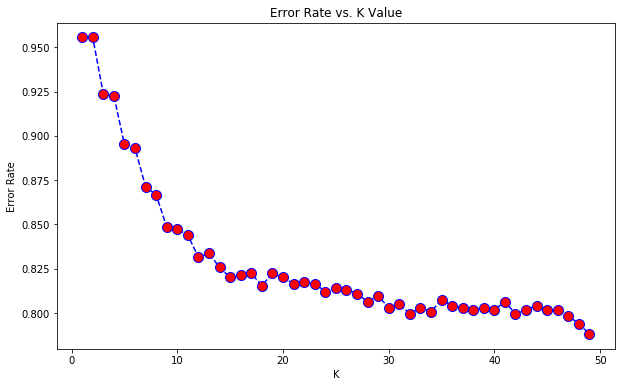

In [447]:
plt.figure(figsize=(10,6))
plt.plot(range(1,50),error_rate,color='blue', linestyle='dashed', marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [448]:
#Distribution of predicted values
pd.Series(knn_predict).value_counts()

 1    628
-1    250
dtype: int64

In [449]:
knn_accuracy

[0.9555808656036446,
 0.9555808656036446,
 0.9236902050113895,
 0.9225512528473804,
 0.8952164009111617,
 0.8929384965831435,
 0.8712984054669703,
 0.8667425968109339,
 0.8485193621867881,
 0.8473804100227791,
 0.8439635535307517,
 0.8314350797266514,
 0.8337129840546698,
 0.8257403189066059,
 0.8200455580865603,
 0.8211845102505695,
 0.8223234624145785,
 0.8154897494305239,
 0.8223234624145785,
 0.8200455580865603,
 0.816628701594533,
 0.8177676537585421,
 0.816628701594533,
 0.8120728929384966,
 0.8143507972665148,
 0.8132118451025057,
 0.8109339407744874,
 0.806378132118451,
 0.8097949886104784,
 0.8029612756264237,
 0.8052391799544419,
 0.7995444191343963,
 0.8029612756264237,
 0.8006833712984055,
 0.8075170842824602,
 0.8041002277904328,
 0.8029612756264237,
 0.8018223234624146,
 0.8029612756264237,
 0.8018223234624146,
 0.806378132118451,
 0.7995444191343963,
 0.8018223234624146,
 0.8041002277904328,
 0.8018223234624146,
 0.8018223234624146,
 0.7984054669703873,
 0.79384965831435

In [450]:
#Since at neighbours =10 the  error rate decrease is constant, we will take 10 as the nearest neighbour count.
knnModel= KNeighborsClassifier(n_neighbors=10,weights = 'distance')

In [451]:
#Add KNN model to model dictionary
models["KNNModel"]=knnModel

In [452]:
models

{'logisticRegression ': LogisticRegression(penalty='l1', solver='saga'),
 'gaussianNB': GaussianNB(),
 'svm': SVC(kernel='poly'),
 'decisionTree': DecisionTreeClassifier(criterion='entropy', max_depth=20, max_leaf_nodes=10),
 'randomForest': RandomForestClassifier(criterion='entropy', max_depth=20, n_estimators=15),
 'KNNModel': KNeighborsClassifier(n_neighbors=10, weights='distance')}

In [453]:
#Loop through each model in dictionary, train , predict and find the accuracy of each model 
accuracy_score_test =[]
accuracy_score_train =[]

for model,objct in models.items():
    print(model)
    objct.fit(X_train,y_train)
    model_predict = objct.predict(X_test)
    model_predict_train=objct.predict(X_train)
    #accuracy_score_train.append(accuracy_score(y_train,model_predict_train))
   # accuracy_score_test.append(accuracy_score(y_ros,model_predict))
    print("Accuracy score for training set for model {} is {}".format(model, accuracy_score(y_train,model_predict_train)))
    print("Accuracy score for testing set for model {} is {}".format(model, accuracy_score(y_test,model_predict)))   
    print("AUC score :\n",roc_auc_score(y_test,model_predict))
    #print out the classification report
    print("Classification report:\n",classification_report(y_test,model_predict))
    print(pd.Series(model_predict).value_counts())

logisticRegression 
Accuracy score for training set for model logisticRegression  is 0.5498046875
Accuracy score for testing set for model logisticRegression  is 0.5489749430523918
AUC score :
 0.5490161484494998
Classification report:
               precision    recall  f1-score   support

          -1       0.55      0.56      0.55       436
           1       0.55      0.54      0.55       442

    accuracy                           0.55       878
   macro avg       0.55      0.55      0.55       878
weighted avg       0.55      0.55      0.55       878

-1    444
 1    434
dtype: int64
gaussianNB
Accuracy score for training set for model gaussianNB is 0.63427734375

C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)



Accuracy score for testing set for model gaussianNB is 0.570615034168565
AUC score :
 0.5705871974760264
Classification report:
               precision    recall  f1-score   support

          -1       0.57      0.57      0.57       436
           1       0.57      0.57      0.57       442

    accuracy                           0.57       878
   macro avg       0.57      0.57      0.57       878
weighted avg       0.57      0.57      0.57       878

 1    443
-1    435
dtype: int64
svm
Accuracy score for training set for model svm is 0.5576171875
Accuracy score for testing set for model svm is 0.5375854214123007
AUC score :
 0.537205778571132
Classification report:
               precision    recall  f1-score   support

          -1       0.54      0.48      0.51       436
           1       0.54      0.59      0.56       442

    accuracy                           0.54       878
   macro avg       0.54      0.54      0.54       878
weighted avg       0.54      0.54      0.54       

#### Hyperparameter tuning using gridSearchCV and randomSearchCV


###### During training and testing with both type of hyperparameter tuning techniques, it was found out that gridSearchCV took a lot of processing time. Hence we proceeded with RandomSearchCV technique.Below are the observations.

In [690]:
#pipeline for each model
pipe_lr = Pipeline([ ('pca', PCA(n_components=5)), ('LogisticReg', logRegression)]) 
pipe_knn=Pipeline([ ('pca', PCA(n_components=7)), ('KNN', knnModel)]) 
pipe_svm=Pipeline([('pca', PCA(n_components=7)), ('SVM', svm)])
pipe_nb=Pipeline([('pca', PCA(n_components=7)), ('NB', gaussianNB)])
pipe_dcl =Pipeline([ ('pca', PCA(n_components=5)), ('DecisionTree', decisionCl)])
pipe_rf =Pipeline([ ('pca', PCA(n_components=5)), ('RandomForest', randomForest)])

In [691]:
#param grid 
param_grid_lr = {'LogisticReg__C':list(range(1,3)),
                'LogisticReg__penalty': ['l1', 'l2'],
                 'LogisticReg__solver':  ['liblinear','saga']
                }

param_grid_knn = {'KNN__n_neighbors': list(range(1,20)),
             'KNN__algorithm': ['auto', 'ball_tree', 'kd_tree' , 'brute'],
             'KNN__weights':['uniform','distance']}


param_grid_svm={'SVM__C':list(range(1,3)),
                'SVM__kernel':['linear', 'poly','rbf']
               }

param_grid_decisionCl = {'DecisionTree__criterion':['gini','entropy'],
                         'DecisionTree__splitter':['best','random'],
                         'DecisionTree__max_depth':list(range(1,200)),
                         'DecisionTree__max_leaf_nodes':list(range(1,200))
                        }

param_grid_rf ={'RandomForest__n_estimators':list(range(1,100)),'RandomForest__criterion':['gini','entropy'],'RandomForest__max_depth':list(range(1,100))}

In [692]:
#Randomised search
rs_lr=  RandomizedSearchCV(pipe_lr,param_grid_lr,n_iter=5,cv=5)
rs_knn = RandomizedSearchCV(pipe_knn,param_grid_knn,n_iter=5,cv=5)
rs_dcl = RandomizedSearchCV(pipe_dcl,param_grid_decisionCl,n_iter=5,cv=5)
rs_svm=GridSearchCV(pipe_svm,param_grid_svm,cv=5)
rs_rf = RandomizedSearchCV(pipe_rf,param_grid_rf,n_iter=5,cv=5)



In [693]:
#grid dictionary
grids = [rs_lr, rs_knn,rs_dcl,rs_rf]
# Dictionary of pipelines and classifier types for ease of reference
grid_dict = {0: 'Logistic Regression', 1: 'KNN',2:'decisionClassifier',3:'RandomForest'}



In [694]:
pipe_dcl.get_params().keys()

dict_keys(['memory', 'steps', 'verbose', 'pca', 'DecisionTree', 'pca__copy', 'pca__iterated_power', 'pca__n_components', 'pca__random_state', 'pca__svd_solver', 'pca__tol', 'pca__whiten', 'DecisionTree__ccp_alpha', 'DecisionTree__class_weight', 'DecisionTree__criterion', 'DecisionTree__max_depth', 'DecisionTree__max_features', 'DecisionTree__max_leaf_nodes', 'DecisionTree__min_impurity_decrease', 'DecisionTree__min_impurity_split', 'DecisionTree__min_samples_leaf', 'DecisionTree__min_samples_split', 'DecisionTree__min_weight_fraction_leaf', 'DecisionTree__random_state', 'DecisionTree__splitter'])

In [695]:
#loop through dictionary for randomSearch and calculate the accuracy, classification report and target distributions
for idx, gs in enumerate(grids):
    print('\nEstimator: %s' % grid_dict[idx])
    # Fit grid search
    gs.fit(X_train, y_train)
    # Best params
    print('Best params: %s' % gs.best_params_)
    # Predict on test data with best params
    y_pred = gs.predict(X_test)
    # Test data accuracy of model with best params
    print('Test set accuracy score for best params: %.3f ' % accuracy_score(y_test, y_pred))
    print('Classification report:\n',classification_report(y_test,y_pred))
    # Track best (highest test accuracy) model
    print("value counts : \n",pd.Series(y_pred).value_counts())


Estimator: Logistic Regression


C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\sklearn\linear_model\_sag.py:329: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  "the coef_ did not converge", ConvergenceWarning)
C:\Users\AshwiniShivaprasad\anaconda\lib\site-packages\sklearn\linear_model\_sag.py:329: Convergence

Best params: {'LogisticReg__solver': 'liblinear', 'LogisticReg__penalty': 'l1', 'LogisticReg__C': 1}
Test set accuracy score for best params: 0.540 
Classification report:
               precision    recall  f1-score   support

          -1       0.54      0.53      0.53       436
           1       0.54      0.55      0.55       442

    accuracy                           0.54       878
   macro avg       0.54      0.54      0.54       878
weighted avg       0.54      0.54      0.54       878

value counts : 
  1    446
-1    432
dtype: int64

Estimator: KNN
Best params: {'KNN__weights': 'distance', 'KNN__n_neighbors': 3, 'KNN__algorithm': 'kd_tree'}
Test set accuracy score for best params: 0.928 
Classification report:
               precision    recall  f1-score   support

          -1       1.00      0.86      0.92       436
           1       0.88      1.00      0.93       442

    accuracy                           0.93       878
   macro avg       0.94      0.93      0.93       

In [696]:
#Naive Bayes pipeline
pipe_nb.fit(X_train,y_train)
pipe_predict =pipe_nb.predict(X_test)
print("Accuracy score:",accuracy_score(y_test,pipe_predict))
print("Classification report:\n",classification_report(y_test,pipe_predict))
print("value counts : \n",pd.Series(pipe_predict).value_counts())

Accuracy score: 0.5592255125284739
Classification report:
               precision    recall  f1-score   support

          -1       0.55      0.59      0.57       436
           1       0.57      0.53      0.55       442

    accuracy                           0.56       878
   macro avg       0.56      0.56      0.56       878
weighted avg       0.56      0.56      0.56       878

value counts : 
 -1    463
 1    415
dtype: int64


#### Display the results of models 
#### 1. Without tuning 

##### Results for test set 
| Model/metrics|Precision|Recall|AUC|F1|Accuracy|Pass(-1)|Fail(1)|
|:---:|:-------------|:-----------|:-----------|:-----------|:-----------|:-----------|:-----------|
| Logistic Regression|0.52|0.56|0.53|0.54|0.53|444|434|
| K-Nearest Neighbour|1|0.68|0.84|0.81|0.84|576|302|
| Naive Bayes|0.59|0.60|0.59|0.47|0.65|443|435|
|svm|0.54|0.58|0.55|0.56|0.55|488|390|
|Random Forest|1|0.94|0.97|0.97|0.97|444|434|
|Decision tree|0.66|0.77|0.673|0.68|0.67|667|211|


##### Results for training set 
| Model/metrics|Accuracy|
|:---:|:-------------|
| Logistic Regression|0.55|
| K-Nearest Neighbour|1|
| Naive Bayes|0.62|
|svm|0.53|
|Random Forest|0.98|
|Decision tree|0.61|


#### 2. With tuning
| Model/metrics|Precision|Recall|F1|Accuracy|Pass(-1)|Fail(1)|
|:---:|:-------------|:-----------|:-----------|:-----------|:-----------|:-----------|
| Logistic Regression|0.52|0.51|0.52|0.54|446|432|
| K-Nearest Neighbour|1|0.79|0.88|0.93|505|373|
| Naive Bayes|0.55|0.58|0.56|0.56|463|415|
|Random Forest|1|0.98|0.99|0.99|452|426|
|Decision tree|1|0.88|0.93|0.94|493|385|

#### Model selected:
         
Out of all these cases, since random forest has the maximum accuracy and F1 score, we will pick this for future predictions.
The performance of random forest model has found to be consistent for all combination of dataset.
        

### Import the future data file and predict the outcomes using model picked above i.e RandomForest

In [918]:

#Loading data and data cleaning
signal_pred=pd.read_excel('Future_predictions.xlsx')

In [919]:
signal_pred.shape

(18, 591)

In [920]:
signal_pred.head(5)

,Time,0,1,2,3,4,5,6,7,8,...,580,581,582,583,584,585,586,587,588,589
0,2008-07-19 11:55:00,3030.93,2564.00,2187.7333,1411.1265,1.3602,100,97.6133,0.1242,1.5005,...,NaN,NaN,0.5005,0.0118,0.0035,2.3630,NaN,NaN,NaN,NaN
1,2008-07-19 12:32:00,3095.78,2465.14,2230.4222,1463.6606,0.8294,100,102.3433,0.1247,1.4966,...,0.0060,208.2045,0.5019,0.0223,0.0055,4.4447,0.0096,0.0201,0.0060,208.2045
2,2008-07-19 13:17:00,2932.61,2559.94,2186.4111,1698.0172,1.5102,100,95.4878,0.1241,1.4436,...,0.0148,82.8602,0.4958,0.0157,0.0039,3.1745,0.0584,0.0484,0.0148,82.8602
3,2008-07-19 14:43:00,2988.72,2479.90,2199.0333,909.7926,1.3204,100,104.2367,0.1217,1.4882,...,0.0044,73.8432,0.4990,0.0103,0.0025,2.0544,0.0202,0.0149,0.0044,73.8432
4,2008-07-19 15:22:00,3032.24,2502.87,2233.3667,1326.5200,1.5334,100,100.3967,0.1235,1.5031,...,NaN,NaN,0.4800,0.4766,0.1045,99.3032,0.0202,0.0149,0.0044,73.8432


In [921]:
columns_not_drop=signal_processed_df.columns
columns_not_drop=columns_not_drop[:-1]
columns_not_drop

Index(['20', '86', '87', '88', '113', '115', '116', '119', '120', '156', '221',
       '223', '248', '250', '254', '255', '291', '359', '361', '386', '388',
       '392', '393', '429', '493', '495', '520', '522', '526', '527', '571',
       '577'],
      dtype='object')

In [922]:
signal_pred_processed=signal_pred.dropna(axis=1)
signal_pred_processed.shape

(18, 535)

In [923]:
signal_pred_processed.isnull().sum()

Time    0
0       0
1       0
2       0
3       0
       ..
577     0
582     0
583     0
584     0
585     0
Length: 535, dtype: int64

In [924]:
unique_count=signal_pred_processed.nunique()
unique_count


Time    18
0       18
1       18
2       11
3       11
        ..
577     18
582     17
583     18
584     15
585     18
Length: 535, dtype: int64

In [925]:
#Drop the columns that have single values
to_del = [i for i,v in enumerate(unique_count) if v == 1]
to_del

[6,
 14,
 43,
 50,
 53,
 70,
 73,
 95,
 108,
 135,
 143,
 170,
 171,
 178,
 181,
 182,
 183,
 184,
 185,
 186,
 198,
 201,
 217,
 220,
 221,
 222,
 223,
 224,
 225,
 226,
 227,
 228,
 231,
 232,
 233,
 234,
 236,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 263,
 271,
 298,
 299,
 300,
 307,
 310,
 311,
 312,
 313,
 314,
 315,
 327,
 330,
 346,
 351,
 352,
 353,
 354,
 355,
 356,
 357,
 360,
 361,
 362,
 363,
 365,
 372,
 373,
 374,
 375,
 376,
 377,
 378,
 379,
 380,
 381,
 382,
 392,
 400,
 427,
 428,
 429,
 436,
 439,
 440,
 441,
 442,
 443,
 444,
 456,
 459,
 475,
 478,
 479,
 480,
 481,
 482,
 483,
 484,
 485,
 486,
 489,
 490,
 491,
 492,
 494,
 501,
 502,
 503,
 504,
 505,
 506,
 507,
 508,
 509,
 510,
 511,
 515,
 516,
 517,
 518]

In [926]:
signal_pred_processed=signal_pred_processed.drop(signal_pred_processed.columns[to_del], axis='columns')

In [927]:
signal_pred_processed.shape

(18, 405)

In [928]:
print(columns_not_drop)

Index(['20', '86', '87', '88', '113', '115', '116', '119', '120', '156', '221',
       '223', '248', '250', '254', '255', '291', '359', '361', '386', '388',
       '392', '393', '429', '493', '495', '520', '522', '526', '527', '571',
       '577'],
      dtype='object')


In [929]:
signal_pred_processed=signal_pred_processed[[20,86,87, 88, 113, 115, 116, 119, 120, 156, 221, 223, 248, 250, 254, 255, 291, 359, 361, 386, 388, 392, 393, 429, 493, 495, 520, 522, 526, 527, 571, 577]]

In [930]:
signal_pred_processed.shape

(18, 32)

In [931]:
signal_pred_processed.isnull().any()

20     False
86     False
87     False
88     False
113    False
115    False
116    False
119    False
120    False
156    False
221    False
223    False
248    False
250    False
254    False
255    False
291    False
359    False
361    False
386    False
388    False
392    False
393    False
429    False
493    False
495    False
520    False
522    False
526    False
527    False
571    False
577    False
dtype: bool

In [933]:
#Predicting for future prediction file using RandomForest model built above.
y_pred= rs_rf.predict(signal_pred_processed)

In [936]:
#Displaying the predictions
y_pred

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1,
       -1], dtype=int64)

In [935]:
#Distribution of predicted values.
pd.Series(y_pred).value_counts()

-1    18
dtype: int64

###  6. Conclusion
From the results dislayed above, following are the conclusions:
    1. Balancing the dataset has helped us predict in a  balanced way. In our case , we can observe that the pass/fail ratio has been balanced for every model.
    2.Hyperparameter Tuning techniques like RandomSearchCV has improved the performances for some algorithms like KNN, RandomForest and DecisionTree by selecting the best combination of hyperparameters values . Also it has helped us performed cross validation implicitly.
    3.Pipelining technique has helped us perform 2-3 tasks in one run thus reducing the coding complexity.
    
    